# 1. Imports


1. Verify hd-bet works for PET images (try with and without skull)
     -> If not look at bet2
   
3. Try in Native space rather than MNI space
   
4. Try ADC if available

5. Expand Dataset
   
     -> Check unprocessed data, ADNI data (possibly ADNI for validation later)

6. Read literature and try different architectures
   
    -> Log metrics on test set after each experiment
        (SSIM, MSE, Inception score)

If use department GPU, make sure don't hog resources (esp if running overnight)

In [1]:
import matplotlib.pyplot as plt
import multiprocessing as mp
import nibabel as nib
import numpy as np
import os
import pandas as pd
import tempfile
from sklearn import metrics
import time
from time import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from monai.networks.nets import AHNet
from tqdm import tqdm
import monai
from monai.utils import progress_bar
from monai.config import print_config
from monai.data import Dataset, DataLoader, CacheDataset
from monai.transforms import (
    Activations,
    AsDiscrete,
    Compose,
    EnsureChannelFirstd,
    EnsureTyped,
    LoadImaged,
    MapTransform,
    Orientationd,
    RandRicianNoised,
    RandRotated,
    RandFlipd,
    Resized,
    Rotate90d,
    ScaleIntensityd,
    DeleteItemsd,
    NormalizeIntensityd
)
from monai.losses.ssim_loss import SSIMLoss
import statistics

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="5,6,7"

In [3]:
%store -r dictionary_train
%store -r dictionary_valid
%store -r dictionary_test

In [4]:
# global variables
image_size = (128,128,64)

# 2. MONAI Dataloader

In [5]:
#To turn 4D images to 3D (from Ashley's classifier)
class MakeSingleVolumed(MapTransform):
    def __call__(self, data):
        for key in self.keys:
            num_volumes = data[key].shape[0]
            data["NumVolumes"] = num_volumes
            
            if num_volumes != 1:
                middle_volume = num_volumes // 2
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][middle_volume,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
            else:
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][0,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
                
        return data

#This uses the mask to scale the intensity of the image (not being used rn)
class ScaleImaged(MapTransform):
    def __call__(self, data):
            data[self.keys[0]] *= (0.4+data[self.keys[1]])

            return data

In [6]:
train_transforms = Compose(
    [
        LoadImaged(keys=["t1", "t1c", "t2", "flair", "pet"], reader=monai.data.ITKReader, image_only=True),
        EnsureChannelFirstd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Orientationd(keys=["t1", "t1c", "t2", "flair", "pet"], axcodes="RAS"),        
        EnsureTyped(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Resized(keys=["t1", "t1c", "t2", "flair", "pet"], spatial_size=image_size),
        MakeSingleVolumed(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Rotate90d(keys=["t1", "t1c", "t2", "flair", "pet"]),
        RandFlipd(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.6, range_z=0.3),
        ScaleIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        NormalizeIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"])
    ]
)

In [7]:
val_files = dictionary_train[:10]

check_ds = Dataset(data=val_files, transform=train_transforms)
check_DataLoader = DataLoader(check_ds, batch_size=1, shuffle=False)

It has been 15.081615209579468 seconds since the loop started


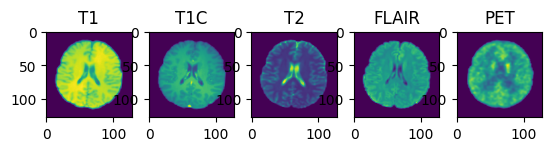

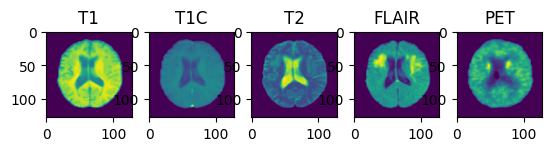

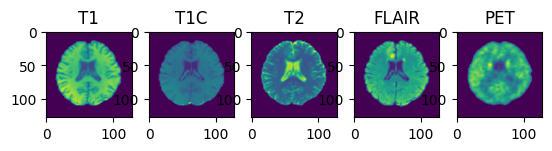

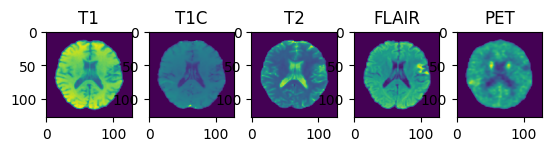

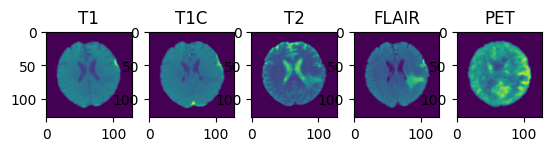

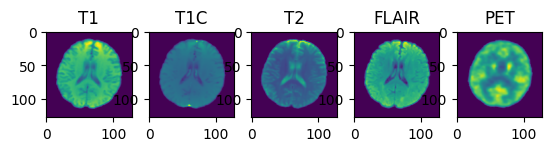

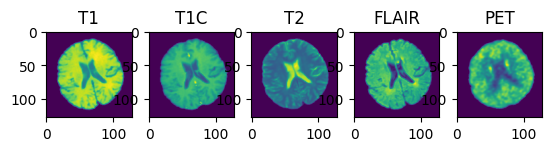

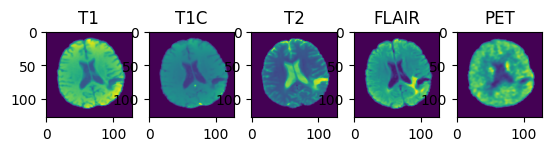

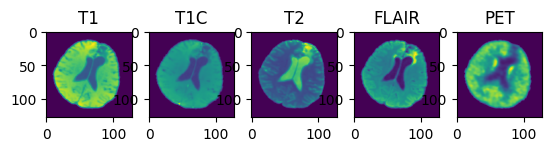

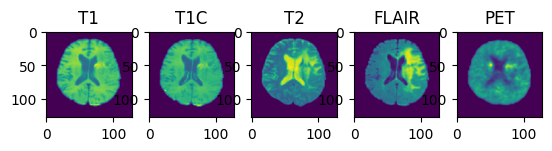

In [8]:
program_starts = time()
step = 1350
slice_index = 32
for item in check_DataLoader:
    image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index]
    
    f, axarr = plt.subplots(1, 5)
    
    axarr[0].imshow(image_datas[0])
    axarr[0].set_title("T1")
    axarr[1].imshow(image_datas[1])
    axarr[1].set_title("T1C")
    axarr[2].imshow(image_datas[2])
    axarr[2].set_title("T2")
    axarr[3].imshow(image_datas[3])
    axarr[3].set_title("FLAIR")
    axarr[4].imshow(image_datas[4])
    axarr[4].set_title("PET")
    
    step += 1
now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

In [9]:
print(os.cpu_count())

train_ds = CacheDataset(data=dictionary_train, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count(), drop_last=False)

train_metric_ds = CacheDataset(data=dictionary_train[:10], transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_metric_loader = DataLoader(train_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

valid_ds = CacheDataset(data=dictionary_valid, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

test_ds = CacheDataset(data=dictionary_test, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

80


Loading dataset:   0%|                                  | 0/185 [00:00<?, ?it/s]

Loading dataset:   1%|▏                       | 1/185 [01:02<3:11:26, 62.42s/it]

Loading dataset:   1%|▎                       | 2/185 [01:04<1:21:53, 26.85s/it]

Loading dataset:   2%|▍                         | 3/185 [01:11<53:36, 17.67s/it]

Loading dataset:   2%|▌                         | 4/185 [01:11<32:39, 10.83s/it]

Loading dataset:   3%|▋                         | 5/185 [01:12<21:47,  7.26s/it]

Loading dataset:   6%|█▍                       | 11/185 [01:15<06:14,  2.15s/it]

Loading dataset:   6%|█▌                       | 12/185 [01:16<05:21,  1.86s/it]

Loading dataset:   7%|█▊                       | 13/185 [01:17<05:15,  1.83s/it]

Loading dataset:   8%|█▉                       | 14/185 [01:17<04:27,  1.56s/it]

Loading dataset:   8%|██                       | 15/185 [01:19<04:38,  1.64s/it]

Loading dataset:   9%|██▏                      | 16/185 [01:25<07:43,  2.74s/it]

Loading dataset:   9%|██▎                      | 17/185 [01:27<06:52,  2.45s/it]

Loading dataset:  10%|██▍                      | 18/185 [01:29<06:24,  2.30s/it]

Loading dataset:  10%|██▌                      | 19/185 [01:30<05:04,  1.84s/it]

Loading dataset:  11%|██▋                      | 20/185 [01:30<04:05,  1.49s/it]

Loading dataset:  11%|██▊                      | 21/185 [01:30<03:04,  1.13s/it]

Loading dataset:  19%|████▋                    | 35/185 [01:31<00:34,  4.30it/s]

Loading dataset:  19%|████▊                    | 36/185 [01:33<00:52,  2.86it/s]

Loading dataset:  20%|█████                    | 37/185 [01:33<00:51,  2.89it/s]

Loading dataset:  21%|█████▏                   | 38/185 [01:36<01:31,  1.61it/s]

Loading dataset:  21%|█████▎                   | 39/185 [01:37<01:33,  1.56it/s]

Loading dataset:  22%|█████▍                   | 40/185 [01:41<02:45,  1.14s/it]

Loading dataset:  22%|█████▌                   | 41/185 [01:42<03:15,  1.36s/it]

Loading dataset:  23%|█████▋                   | 42/185 [01:43<02:50,  1.19s/it]

Loading dataset:  23%|█████▊                   | 43/185 [01:44<02:43,  1.15s/it]

Loading dataset:  24%|█████▉                   | 44/185 [01:44<02:13,  1.06it/s]

Loading dataset:  24%|██████                   | 45/185 [01:45<02:12,  1.06it/s]

Loading dataset:  25%|██████▏                  | 46/185 [01:48<03:01,  1.31s/it]

Loading dataset:  25%|██████▎                  | 47/185 [01:49<03:01,  1.32s/it]

Loading dataset:  26%|██████▍                  | 48/185 [01:49<02:19,  1.02s/it]

Loading dataset:  26%|██████▌                  | 49/185 [01:52<03:11,  1.40s/it]

Loading dataset:  27%|██████▊                  | 50/185 [01:52<02:36,  1.16s/it]

Loading dataset:  28%|██████▉                  | 51/185 [01:54<02:53,  1.29s/it]

Loading dataset:  28%|███████                  | 52/185 [01:55<02:32,  1.15s/it]

Loading dataset:  29%|███████▏                 | 53/185 [01:56<02:50,  1.29s/it]

Loading dataset:  29%|███████▎                 | 54/185 [01:57<02:13,  1.02s/it]

Loading dataset:  30%|███████▍                 | 55/185 [01:57<01:49,  1.19it/s]

Loading dataset:  30%|███████▌                 | 56/185 [01:57<01:29,  1.44it/s]

Loading dataset:  31%|███████▋                 | 57/185 [01:58<01:21,  1.57it/s]

Loading dataset:  44%|██████████▉              | 81/185 [01:59<00:10, 10.17it/s]

Loading dataset:  44%|███████████              | 82/185 [01:59<00:11,  9.35it/s]

Loading dataset:  45%|███████████▏             | 83/185 [02:01<00:20,  5.04it/s]

Loading dataset:  45%|███████████▎             | 84/185 [02:04<00:47,  2.11it/s]

Loading dataset:  46%|███████████▍             | 85/185 [02:06<00:59,  1.67it/s]

Loading dataset:  46%|███████████▌             | 86/185 [02:07<01:06,  1.49it/s]

Loading dataset:  47%|███████████▊             | 87/185 [02:07<01:04,  1.52it/s]

Loading dataset:  48%|███████████▉             | 88/185 [02:08<00:59,  1.62it/s]

Loading dataset:  48%|████████████             | 89/185 [02:09<01:24,  1.13it/s]

Loading dataset:  49%|████████████▏            | 90/185 [02:11<01:36,  1.01s/it]

Loading dataset:  49%|████████████▎            | 91/185 [02:12<01:37,  1.04s/it]

Loading dataset:  50%|████████████▍            | 92/185 [02:12<01:17,  1.19it/s]

Loading dataset:  50%|████████████▌            | 93/185 [02:13<01:17,  1.19it/s]

Loading dataset:  51%|████████████▋            | 94/185 [02:14<01:16,  1.18it/s]

Loading dataset:  51%|████████████▊            | 95/185 [02:14<01:06,  1.36it/s]

Loading dataset:  52%|████████████▉            | 96/185 [02:15<01:04,  1.38it/s]

Loading dataset:  52%|█████████████            | 97/185 [02:15<00:49,  1.80it/s]

Loading dataset:  53%|█████████████▏           | 98/185 [02:15<00:36,  2.36it/s]

Loading dataset:  54%|█████████████▍           | 99/185 [02:16<00:28,  3.02it/s]

Loading dataset:  62%|██████████████▉         | 115/185 [02:16<00:03, 19.19it/s]

Loading dataset:  65%|███████████████▌        | 120/185 [02:16<00:03, 20.42it/s]

Loading dataset:  68%|████████████████▏       | 125/185 [02:16<00:02, 23.96it/s]

Loading dataset:  88%|█████████████████████▏  | 163/185 [02:16<00:00, 60.56it/s]

Loading dataset:  92%|██████████████████████  | 170/185 [02:16<00:00, 59.09it/s]

Loading dataset: 100%|████████████████████████| 185/185 [02:17<00:00, 72.62it/s]

Loading dataset: 100%|████████████████████████| 185/185 [02:17<00:00,  1.35it/s]

Loading dataset:   0%|                                   | 0/10 [00:00<?, ?it/s]

Loading dataset:  10%|██▋                        | 1/10 [00:06<00:54,  6.07s/it]

Loading dataset: 100%|██████████████████████████| 10/10 [00:06<00:00,  1.65it/s]

Loading dataset:   0%|                                    | 0/5 [00:00<?, ?it/s]

Loading dataset:  20%|█████▌                      | 1/5 [00:03<00:13,  3.37s/it]

Loading dataset: 100%|████████████████████████████| 5/5 [00:03<00:00,  1.46it/s]

Loading dataset:   0%|                                   | 0/57 [00:00<?, ?it/s]

Loading dataset:   2%|▍                          | 1/57 [00:46<43:41, 46.81s/it]

Loading dataset:   7%|█▉                         | 4/57 [00:47<07:55,  8.97s/it]

Loading dataset:  42%|██████████▉               | 24/57 [00:47<00:34,  1.03s/it]

Loading dataset:  61%|███████████████▉          | 35/57 [00:47<00:13,  1.62it/s]

Loading dataset: 100%|██████████████████████████| 57/57 [00:47<00:00,  1.20it/s]

# 3. Model Setup


In [10]:
class GLA_Generator(nn.Module):
    def __init__(self):
        super(GLA_Generator, self).__init__()
        self.ahnet_global = AHNet(spatial_dims=3, in_channels=4, out_channels=16, pretrained=True)

        channels = [4, 6, 12, 6, 4]
        strides = [1, 1, 1, 1, 1]
        
        self.ahnet_1 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)
        self.ahnet_2 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)
        self.ahnet_3 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)
        self.ahnet_4 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)

        self.conv1 = nn.Conv3d(20, 16, kernel_size=1)
        self.bn1 = nn.BatchNorm3d(16)
        self.relu = nn.ReLU()
        self.dropout = torch.nn.Dropout(0.4)
        self.conv2 = nn.Conv3d(16, 1, kernel_size=1)
        self.bn2 = nn.BatchNorm3d(1)

    def forward(self, x):
        batch_size, channels, width, height, depth = x.shape
        half_width, half_height = width // 2, height // 2
        
        # Splitting the input into 4 patches
        patch_1 = x[:, :, :half_width, :half_height, :]
        patch_2 = x[:, :, :half_width, half_height:, :]
        patch_3 = x[:, :, half_width:, :half_height, :]
        patch_4 = x[:, :, half_width:, half_height:, :]

        x = self.ahnet_global(x)
        patch_1 = self.ahnet_1(patch_1)
        patch_2 = self.ahnet_2(patch_2)
        patch_3 = self.ahnet_3(patch_3)
        patch_4 = self.ahnet_4(patch_4)

        # Concatenating the processed patches
        top_row = torch.cat([patch_1, patch_2], dim=3)  # Concatenate along the height
        bottom_row = torch.cat([patch_3, patch_4], dim=3)  # Concatenate along the height
        concatenated_patches = torch.cat([top_row, bottom_row], dim=2)  # Concatenate along the width

        x = torch.cat([x, concatenated_patches], dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.conv2(x)
        x = self.bn2(x)

        return x

### 3.1 Model and Device Setup

In [11]:
# Use GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

gen_net = GLA_Generator()

disc_net = monai.networks.nets.Discriminator(
    in_shape=(128, 128, 64),
    channels=(8, 16, 32, 64, 128, 64, 1),
    strides=(2, 2, 2, 2, 2, 1, 1),
    num_res_units=1,
    kernel_size=3,
)

# If multiple GPUs are available, run in parallel
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    gen_net = nn.DataParallel(gen_net)
    disc_net = nn.DataParallel(disc_net)

gen_net.to(device)
disc_net.to(device)

real_label = 1
gen_label = 0

disc_loss = torch.nn.BCELoss()
gen_loss = torch.nn.BCELoss()
gen_loss2 = monai.metrics.MultiScaleSSIMMetric(spatial_dims=3, kernel_size=4)

disc_opt = torch.optim.Adam(disc_net.parameters(), 0.00005)
gen_opt = torch.optim.Adam(gen_net.parameters(), 0.0002)

def discriminator_loss(gen_images, real_images):
    """
    The discriminator loss if calculated by comparing its
    prediction for real and generated images.

    """
    real = real_images.new_full((real_images.shape[0], 1), real_label)
    gen = gen_images.new_full((gen_images.shape[0], 1), gen_label)

    # Training discriminator to label 1 on real images
    realloss = disc_loss(disc_net(real_images), real) 

    # Training discriminator to label 0 on generated images
    genloss = disc_loss(disc_net(gen_images.detach()), gen)

    return (realloss + genloss) / 2


def generator_loss(input, real_images):
    """
    The generator loss is calculated by determining how well
    the discriminator was fooled by the generated images.

    """
    output = disc_net(input[:,0,:,:,:])
    cats = output.new_full(output.shape, real_label)
    fooling_disc = gen_loss(output, cats)
    ssim = 1 - torch.mean(gen_loss2(input, real_images))
    
    # Train generator to fool the discriminator into giving a score of 1, and to have a high SSIM
    return (2*fooling_disc) + ssim

cuda


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


Let's use 3 GPUs!


### 3.2 Training


----------
epoch 1/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:51, 70.18s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.11s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:36, 12.10s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:01,  8.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:40,  6.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.53s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:18,  4.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.23s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  8.67s/it]

----------
epoch 2/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:37, 74.28s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:23, 32.32s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:49, 18.87s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:28,  5.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.79s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  9.00s/it]

----------
epoch 3/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:26, 84.22s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:03, 36.37s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.08s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.89s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 4/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:08, 71.68s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:40,  6.82s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:27,  5.52s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:18,  4.68s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.11s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.76s/it]

----------
epoch 5/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.03s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:38, 12.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:02,  8.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.63s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:18,  4.75s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.16s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.75s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.86s/it]

----------
epoch 6/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:59, 70.82s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:43, 18.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:01,  8.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:40,  6.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.51s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:18,  4.67s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.11s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  8.71s/it]

----------
epoch 7/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:24, 73.13s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.95s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:18,  4.73s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.14s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.75s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.85s/it]

----------
epoch 8/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.97s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:38, 12.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:02,  8.94s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.88s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:27,  5.58s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.80s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.89s/it]

----------
epoch 9/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:44, 74.91s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:25, 32.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:52, 19.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:28,  5.66s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.77s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:12,  4.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.77s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 10/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:27, 73.40s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.80s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.89s/it]

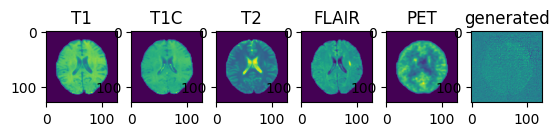

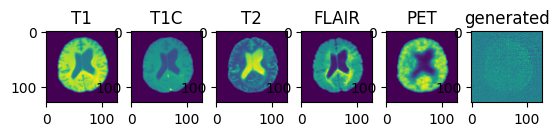

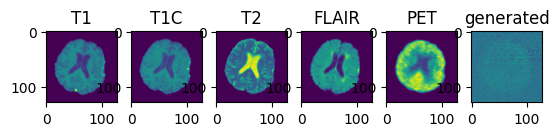

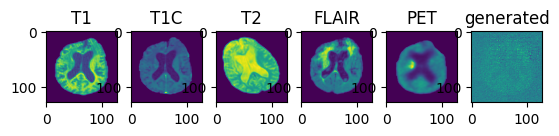

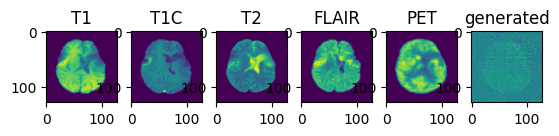

validation avg MS-SSIM: 0.1138 , train avg MS-SSIM: 0.1086
----------
epoch 11/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.14s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.62s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:38, 12.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.85s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:27,  5.55s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:18,  4.69s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.12s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.80s/it]

----------
epoch 12/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:32, 73.90s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:41,  7.00s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.76s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.76s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.98s/it]

----------
epoch 13/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:02, 76.63s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:32, 33.27s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:54, 19.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.89s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.17s/it]

----------
epoch 14/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:01, 76.52s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:32, 33.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.94s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.18s/it]

----------
epoch 15/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.09s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.80s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

----------
epoch 16/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.77s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.84s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:27,  5.54s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:18,  4.69s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.11s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.77s/it]

----------
epoch 17/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:25, 73.21s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:47, 18.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:02,  8.99s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.66s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.79s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

----------
epoch 18/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:02, 76.57s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:32, 33.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:54, 19.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:42, 12.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:28,  5.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.81s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  3.85s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.18s/it]

----------
epoch 19/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:34, 74.06s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:22, 32.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.81s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.21s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.98s/it]

----------
epoch 20/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:35, 74.16s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:22, 32.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:41,  6.95s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.83s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.93s/it]

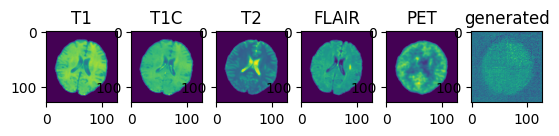

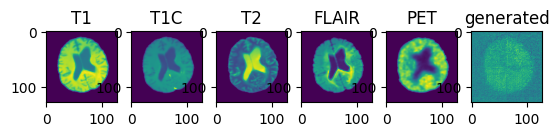

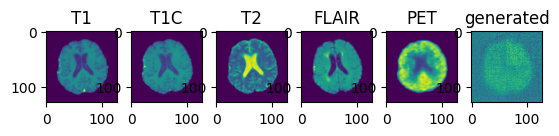

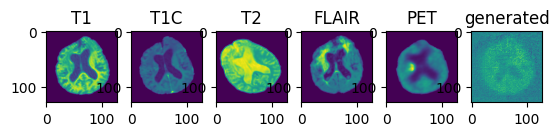

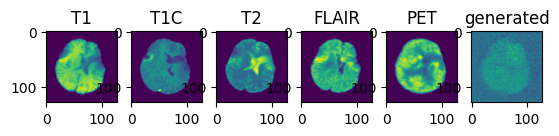

validation avg MS-SSIM: 0.3004 , train avg MS-SSIM: 0.2988
----------
epoch 21/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:33, 73.91s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.67s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.91s/it]

----------
epoch 22/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.90s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 23/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:33, 73.95s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.76s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.18s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.77s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.93s/it]

----------
epoch 24/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<13:57, 76.09s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:30, 33.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:53, 19.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:42, 12.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:28,  5.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:12,  4.25s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 25/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<13:59, 76.32s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:31, 33.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:54, 19.34s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:12,  4.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.15s/it]

----------
epoch 26/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:30, 73.72s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:02,  9.00s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:41,  6.91s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.68s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 27/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<13:59, 76.27s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:32, 33.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:54, 19.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.89s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.20s/it]

----------
epoch 28/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:38, 79.90s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.15s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.46s/it]

----------
epoch 29/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:28, 78.98s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:42, 34.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.53s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.39s/it]

----------
epoch 30/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:24, 78.59s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.10s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:58, 19.87s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.38s/it]

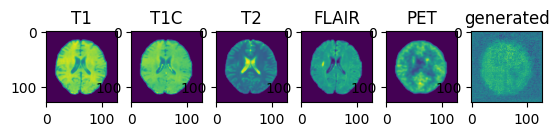

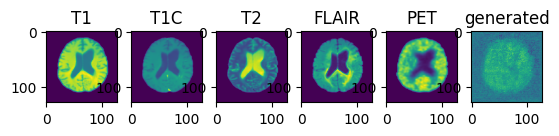

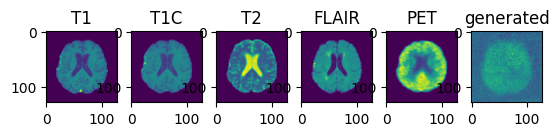

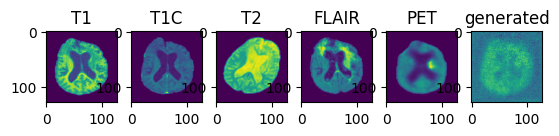

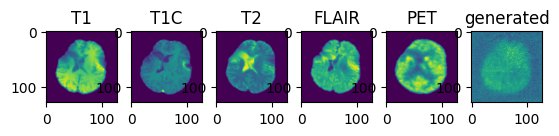

validation avg MS-SSIM: 0.3485 , train avg MS-SSIM: 0.3501
----------
epoch 31/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:28, 78.92s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:42, 34.24s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.85s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.40s/it]

----------
epoch 32/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:20, 78.21s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:39, 33.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:57, 19.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:06,  9.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.31s/it]

----------
epoch 33/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:27, 78.84s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.17s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.46s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.86s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.33s/it]

----------
epoch 34/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:17, 77.95s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:37, 33.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:06,  9.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.27s/it]

----------
epoch 35/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:32, 73.82s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 36/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:03, 76.72s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:33, 33.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:54, 19.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:44, 13.05s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.40s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.21s/it]

----------
epoch 37/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:10, 77.33s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:35, 33.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:56, 19.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:43, 12.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.34s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.23s/it]

----------
epoch 38/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:23, 78.47s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:42, 34.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.96s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.49s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.25s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.35s/it]

----------
epoch 39/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:31, 79.21s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:43, 34.32s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<02:59, 19.99s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.37s/it]

----------
epoch 40/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:35, 79.56s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.43s/it]

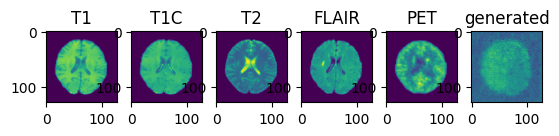

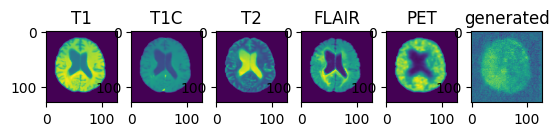

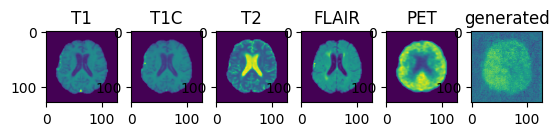

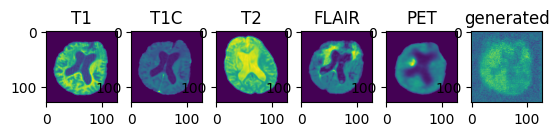

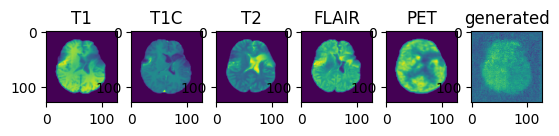

validation avg MS-SSIM: 0.3535 , train avg MS-SSIM: 0.3540
----------
epoch 41/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:34, 79.50s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.44s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.25s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.39s/it]

----------
epoch 42/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:31, 79.26s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:43, 34.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.40s/it]

----------
epoch 43/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:33, 79.41s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:43, 34.40s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.25s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.40s/it]

----------
epoch 44/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:12, 77.53s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:36, 33.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:05,  9.42s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.85s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.23s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.24s/it]

----------
epoch 45/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:47, 80.71s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 46/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:36, 79.71s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.50s/it]

----------
epoch 47/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:05, 76.83s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:33, 33.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.90s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.18s/it]

----------
epoch 48/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:21, 78.31s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:39, 33.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:57, 19.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:06,  9.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.21s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.31s/it]

----------
epoch 49/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:10, 77.35s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:35, 33.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:55, 19.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.12s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:05,  9.42s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.85s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.83s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.23s/it]

----------
epoch 50/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:20, 78.25s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:39, 33.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:57, 19.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:05,  9.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.29s/it]

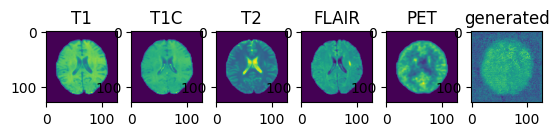

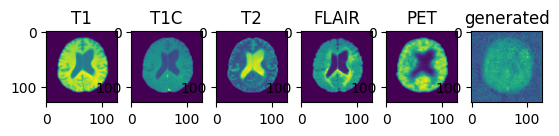

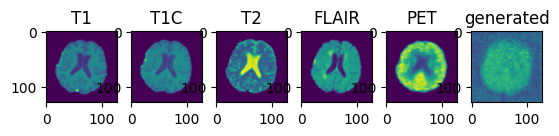

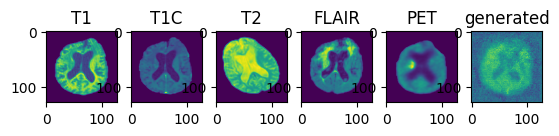

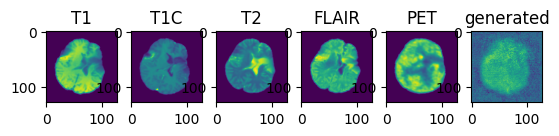

validation avg MS-SSIM: 0.3324 , train avg MS-SSIM: 0.3308
----------
epoch 51/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:40, 80.03s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.71s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.47s/it]

----------
epoch 52/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:48, 80.81s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:43,  7.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.50s/it]

----------
epoch 53/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:25, 78.64s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:58, 19.87s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.54s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.35s/it]

----------
epoch 54/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:27, 78.87s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.19s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.48s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.24s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.39s/it]

----------
epoch 55/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:35, 79.62s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.43s/it]

----------
epoch 56/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:06, 77.00s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:34, 33.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.34s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.85s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.17s/it]

----------
epoch 57/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:37, 79.81s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:02, 20.25s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.46s/it]

----------
epoch 58/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<13:57, 76.16s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:30, 33.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:53, 19.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:42, 12.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:04,  9.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:12,  4.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  3.83s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.11s/it]

----------
epoch 59/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:21, 78.29s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:58, 19.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.48s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.31s/it]

----------
epoch 60/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:54, 81.33s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.19s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:03, 20.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.55s/it]

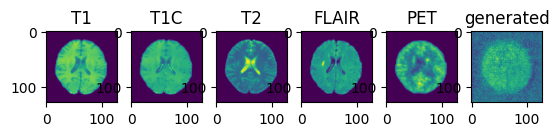

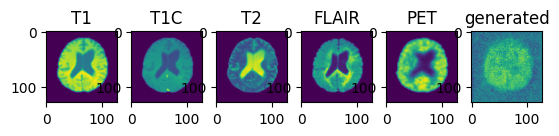

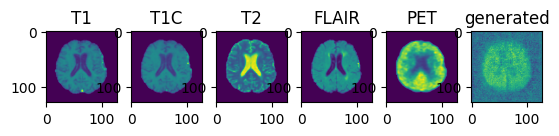

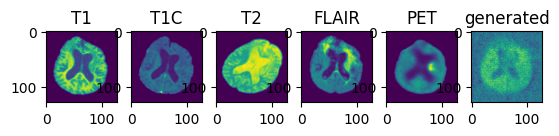

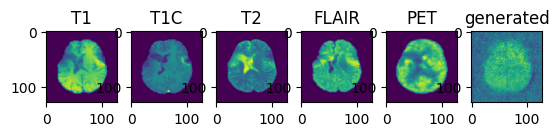

validation avg MS-SSIM: 0.3332 , train avg MS-SSIM: 0.3328
----------
epoch 61/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:35, 79.60s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.29s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.54s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 62/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:18, 78.05s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:38, 33.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.08s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:05,  9.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.86s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.29s/it]

----------
epoch 63/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:44, 80.38s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.80s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:01, 20.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.71s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.50s/it]

----------
epoch 64/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:05, 76.85s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:33, 33.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.82s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.21s/it]

----------
epoch 65/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:06, 76.93s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:33, 33.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.20s/it]

----------
epoch 66/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:23, 78.49s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:40, 34.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:58, 19.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.13s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:05,  9.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.31s/it]

----------
epoch 67/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:24, 78.63s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:40, 34.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<03:00, 20.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.38s/it]

----------
epoch 68/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:39, 80.00s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.41s/it]

----------
epoch 69/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:56, 81.50s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 70/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:32, 79.34s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:43, 34.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:45, 13.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.39s/it]

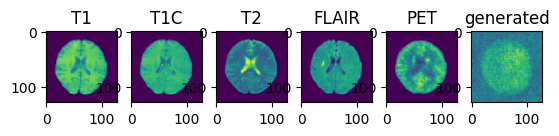

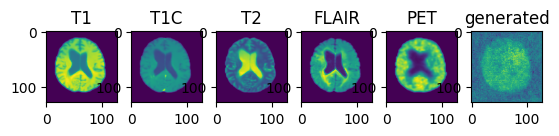

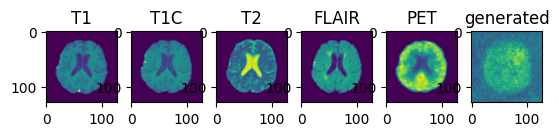

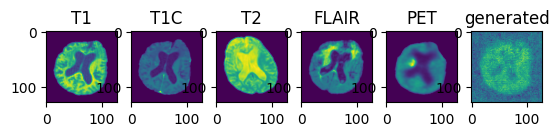

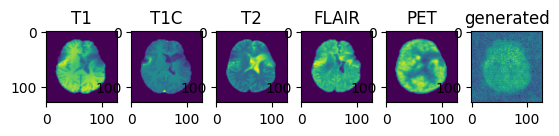

validation avg MS-SSIM: 0.3433 , train avg MS-SSIM: 0.3469
----------
epoch 71/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:14, 83.10s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.99s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

----------
epoch 72/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:58, 81.70s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 73/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:51, 81.05s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 74/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:33, 79.43s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.25s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.39s/it]

----------
epoch 75/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:47, 80.68s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.71s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.85s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.50s/it]

----------
epoch 76/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:51, 81.03s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 77/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:13, 77.62s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:36, 33.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.09s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:05,  9.42s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.86s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.25s/it]

----------
epoch 78/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:48, 80.82s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.36s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 79/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:43, 80.32s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.64s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.50s/it]

----------
epoch 80/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:18, 78.01s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:38, 33.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.08s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:05,  9.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.29s/it]

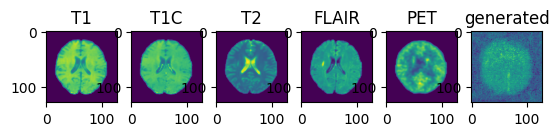

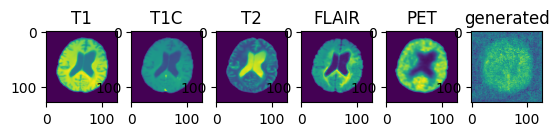

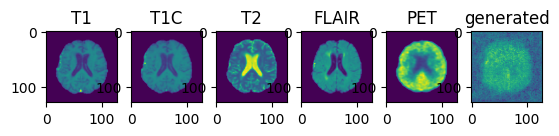

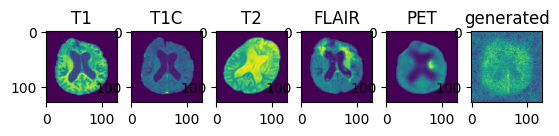

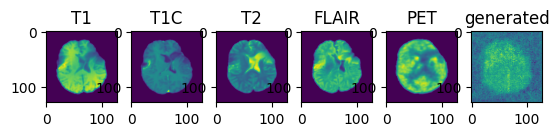

validation avg MS-SSIM: 0.3192 , train avg MS-SSIM: 0.3228
----------
epoch 81/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.86s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.50s/it]

----------
epoch 82/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:38, 79.86s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.45s/it]

----------
epoch 83/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:42, 80.26s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:01, 20.21s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.48s/it]

----------
epoch 84/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:17, 77.97s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.55s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.39s/it]

----------
epoch 85/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:43, 80.31s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.49s/it]

----------
epoch 86/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:42, 80.22s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.49s/it]

----------
epoch 87/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:00, 81.82s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.40s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 88/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:37, 79.74s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.58s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.12s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.46s/it]

----------
epoch 89/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:28<16:13, 88.48s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:21, 38.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:20, 22.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:37<01:57, 14.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:12, 10.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:47,  7.86s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:31,  6.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:13,  4.49s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:55<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:58<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00, 10.25s/it]

----------
epoch 90/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:14, 83.13s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:07, 20.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.79s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

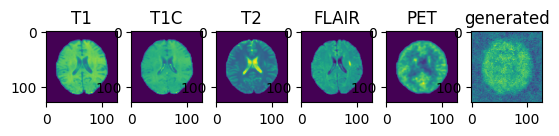

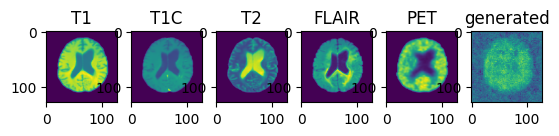

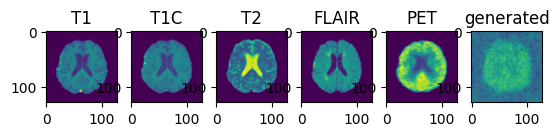

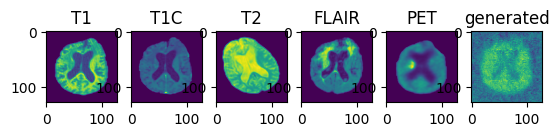

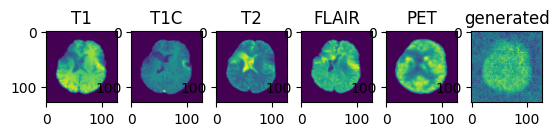

validation avg MS-SSIM: 0.3460 , train avg MS-SSIM: 0.3519
----------
epoch 91/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:20, 78.23s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:39, 33.91s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:43,  7.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.26s/it]

----------
epoch 92/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:47, 80.64s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.47s/it]

----------
epoch 93/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:24, 78.61s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:58, 19.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.31s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.33s/it]

----------
epoch 94/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:27, 78.91s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:42, 34.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.47s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.33s/it]

----------
epoch 95/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:29, 79.04s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:42, 34.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.11s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.40s/it]

----------
epoch 96/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:30<16:39, 90.89s/it]

Epoch :  17%|██████                              | 2/12 [01:33<06:31, 39.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:36<03:23, 22.60s/it]

Epoch :  33%|████████████                        | 4/12 [01:39<01:58, 14.82s/it]

Epoch :  42%|███████████████                     | 5/12 [01:42<01:13, 10.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:45<00:47,  7.92s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:48<00:32,  6.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:21,  5.30s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:13,  4.56s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.38s/it]

----------
epoch 97/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:41, 80.10s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.70s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 98/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:43, 80.33s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 99/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.04s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.68s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 100/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:14, 83.15s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

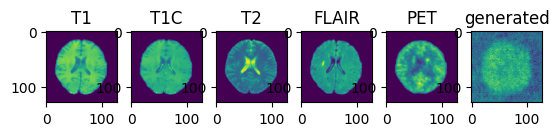

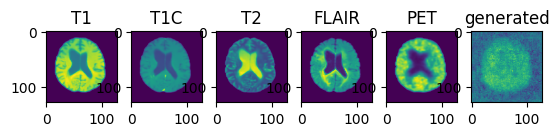

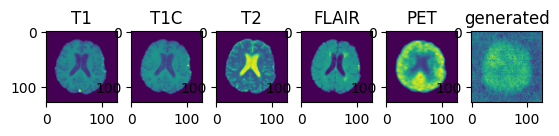

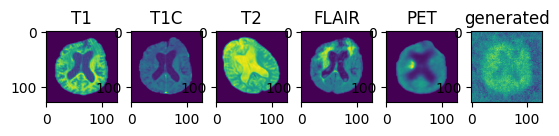

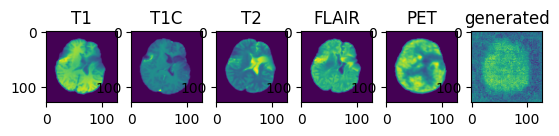

validation avg MS-SSIM: 0.3336 , train avg MS-SSIM: 0.3348
----------
epoch 101/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:01, 81.91s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.45s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.63s/it]

----------
epoch 102/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.09s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:55, 35.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

----------
epoch 103/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:35, 79.57s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.47s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.64s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.85s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.40s/it]

----------
epoch 104/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:00, 81.85s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.68s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 105/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:10, 82.75s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.69s/it]

----------
epoch 106/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.14s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 107/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:38, 79.83s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.48s/it]

----------
epoch 108/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.17s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.63s/it]

----------
epoch 109/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:57, 81.60s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:06, 20.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.78s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 110/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.11s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.68s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

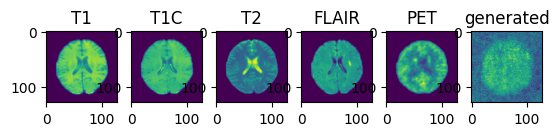

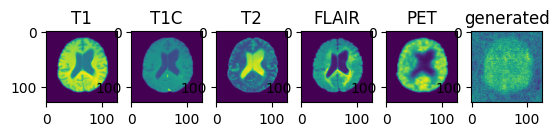

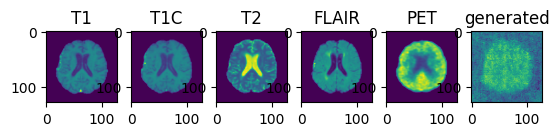

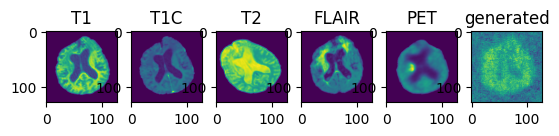

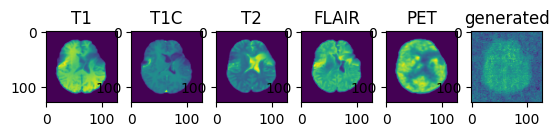

validation avg MS-SSIM: 0.3270 , train avg MS-SSIM: 0.3303
----------
epoch 111/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:20, 83.64s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:44,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

----------
epoch 112/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:58, 81.68s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.52s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 113/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:54, 86.77s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:14, 37.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:15, 21.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:46,  7.70s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:31,  6.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:53<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 114/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:53, 81.21s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 115/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:54, 81.31s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:03, 20.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.68s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 116/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:30, 79.11s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.41s/it]

----------
epoch 117/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:56, 81.53s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 118/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:09, 82.66s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 119/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:07, 82.53s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 120/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.17s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.64s/it]

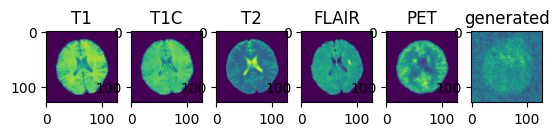

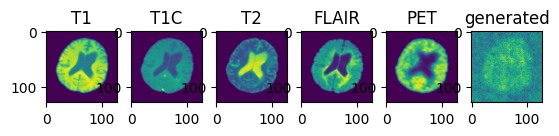

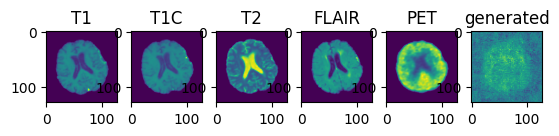

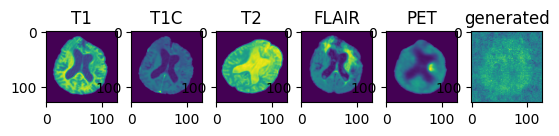

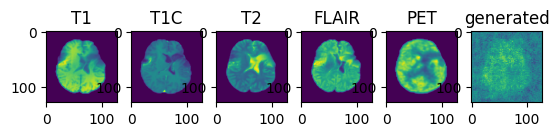

validation avg MS-SSIM: 0.2549 , train avg MS-SSIM: 0.2622
----------
epoch 121/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:09, 82.69s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 122/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:40, 85.49s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:09, 36.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:12, 21.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:52, 14.09s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:10, 10.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:45,  7.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 123/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<15:58, 87.17s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:15, 37.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:15, 21.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:54, 14.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:11, 10.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:13,  4.52s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 124/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:39, 85.38s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:08, 36.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:12, 21.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:52, 14.08s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:11, 10.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 125/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:34, 84.97s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:52, 14.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.00s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 126/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:35, 85.04s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.30s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:52, 14.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:10, 10.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:46,  7.68s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 127/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:29<16:22, 89.36s/it]

Epoch :  17%|██████                              | 2/12 [01:32<06:24, 38.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:35<03:20, 22.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:38<01:56, 14.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:12, 10.37s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:47,  7.84s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:31,  6.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:13,  4.55s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:55<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:58<00:03,  3.68s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00, 10.24s/it]

----------
epoch 128/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:16, 83.30s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.92s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

----------
epoch 129/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:01, 81.91s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 130/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.13s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

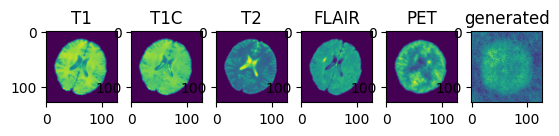

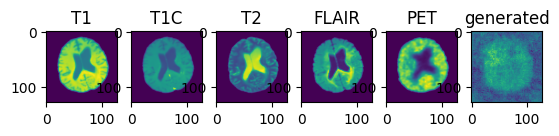

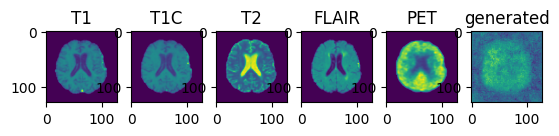

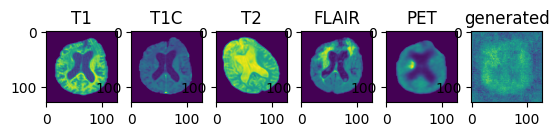

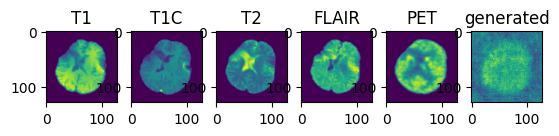

validation avg MS-SSIM: 0.3158 , train avg MS-SSIM: 0.3201
----------
epoch 131/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.08s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:11, 21.30s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:52, 14.04s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:10, 10.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

----------
epoch 132/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:40, 80.04s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 133/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:55, 81.42s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 134/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:10, 82.76s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 135/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.18s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 136/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:17, 83.42s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

----------
epoch 137/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:06, 82.38s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.63s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.77s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 138/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:37, 79.78s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.10s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.55s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.45s/it]

----------
epoch 139/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.86s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 140/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:17, 83.43s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

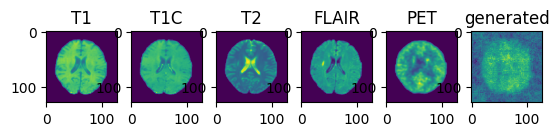

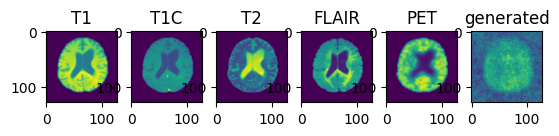

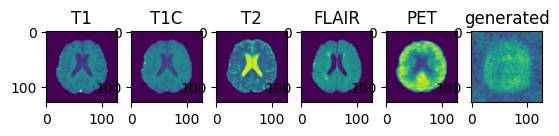

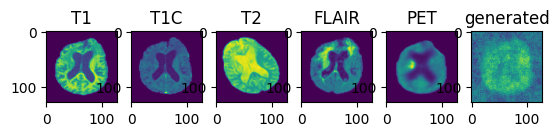

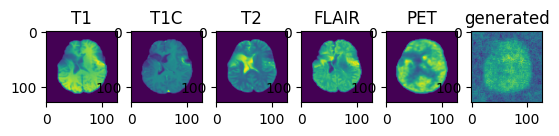

validation avg MS-SSIM: 0.3285 , train avg MS-SSIM: 0.3315
----------
epoch 141/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:20, 83.68s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.94s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

----------
epoch 142/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:13, 83.05s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:59, 35.91s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.67s/it]

----------
epoch 143/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.07s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:55, 35.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 144/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:59, 81.73s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:06, 20.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.62s/it]

----------
epoch 145/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:07, 82.52s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.70s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.64s/it]

----------
epoch 146/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.61s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.70s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:08, 20.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.68s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

----------
epoch 147/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:10, 82.77s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 148/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:24, 84.09s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:05, 36.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.17s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:51, 13.94s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 149/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.82s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 150/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:04, 82.21s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

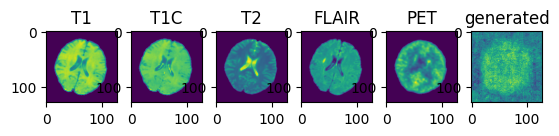

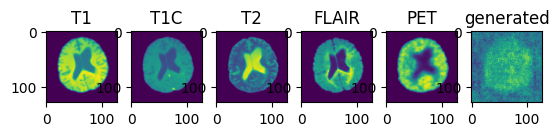

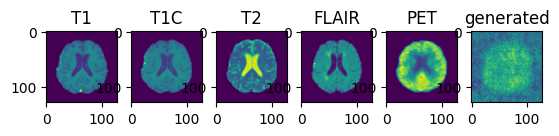

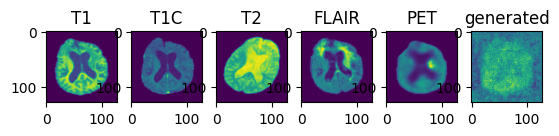

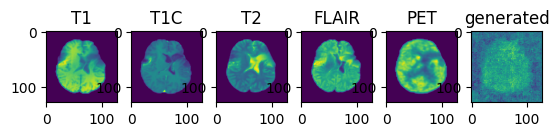

validation avg MS-SSIM: 0.2856 , train avg MS-SSIM: 0.2963
----------
epoch 151/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:21, 83.81s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:02, 36.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.30s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:52, 14.04s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 152/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:00, 81.86s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 153/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:19, 83.56s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:03, 36.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.08s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.90s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 154/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:54, 81.28s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 155/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:36, 79.73s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.21s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 156/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:06, 82.44s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.64s/it]

----------
epoch 157/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.84s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

----------
epoch 158/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:05, 82.30s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 159/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:50, 80.95s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.28s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 160/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.90s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:11, 10.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.71s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.13s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

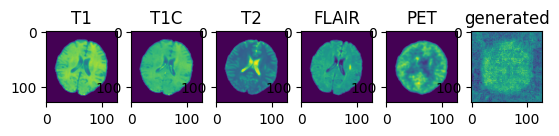

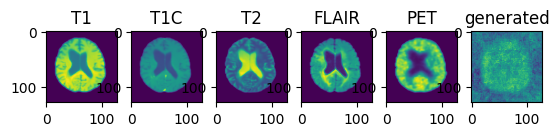

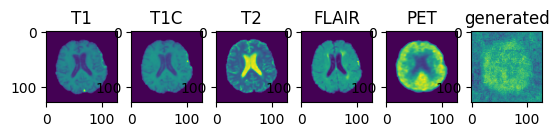

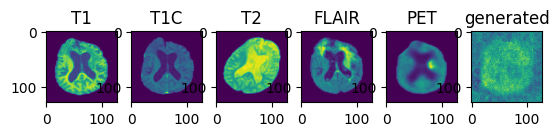

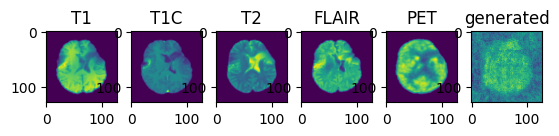

validation avg MS-SSIM: 0.2779 , train avg MS-SSIM: 0.2835
----------
epoch 161/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:12, 82.92s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.61s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

----------
epoch 162/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:53, 86.68s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:15, 37.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:15, 21.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:54, 14.29s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:46,  7.69s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.05s/it]

----------
epoch 163/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:55, 81.38s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.24s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.48s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:07,  9.70s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 164/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:54, 81.35s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.22s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.70s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 165/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.87s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:11, 10.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.73s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

----------
epoch 166/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:13, 83.06s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:59, 35.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 167/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:20, 83.64s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.85s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:11, 10.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.71s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 168/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:50, 80.94s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.65s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 169/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.89s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 35.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.56s/it]

----------
epoch 170/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:58, 81.66s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.34s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

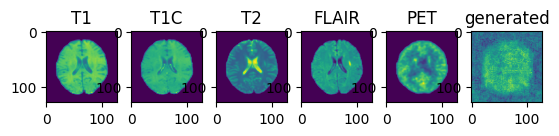

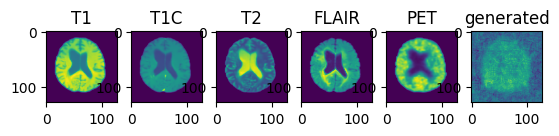

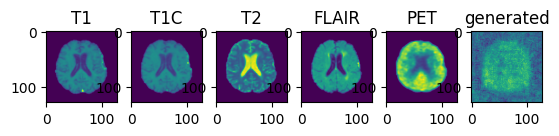

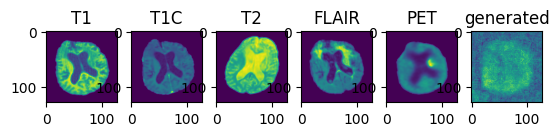

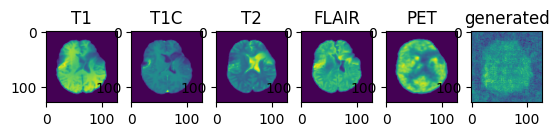

validation avg MS-SSIM: 0.3007 , train avg MS-SSIM: 0.3063
----------
epoch 171/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.56s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:59, 35.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.69s/it]

----------
epoch 172/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:15, 83.21s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.97s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:07, 20.87s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.77s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

----------
epoch 173/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:12, 82.91s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 174/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:55, 81.42s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.22s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.68s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 175/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:18, 83.50s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:02, 36.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.86s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 176/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:19, 83.57s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 177/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:09, 82.73s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.76s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

----------
epoch 178/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:01, 81.91s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 179/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:56, 81.54s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 180/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.04s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:55, 35.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.62s/it]

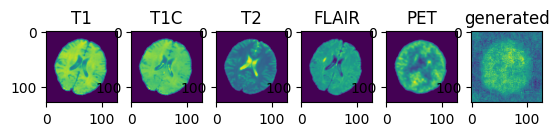

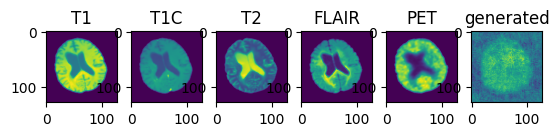

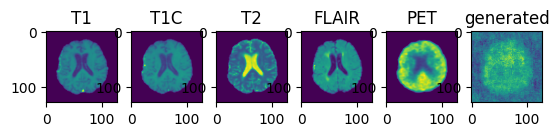

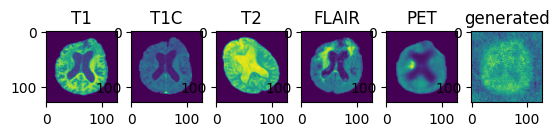

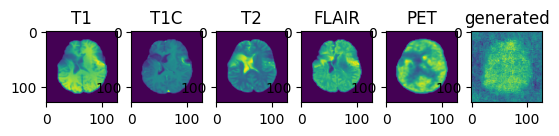

validation avg MS-SSIM: 0.3037 , train avg MS-SSIM: 0.3085
----------
epoch 181/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:09, 82.70s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.78s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 182/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.64s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:08, 20.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.68s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 183/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:55, 81.37s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 184/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:54, 81.29s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.32s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 185/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:17, 83.39s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 186/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:40, 80.01s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.49s/it]

----------
epoch 187/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:53, 81.21s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:03, 20.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 188/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:45, 80.51s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:51, 35.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.68s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 189/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:46, 80.56s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.64s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 190/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:48, 80.73s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.95s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

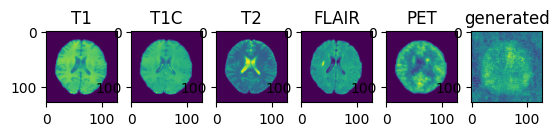

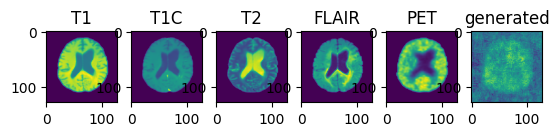

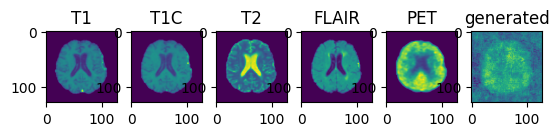

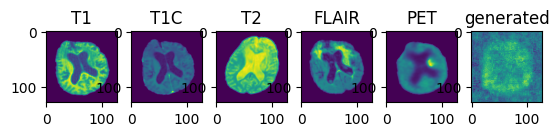

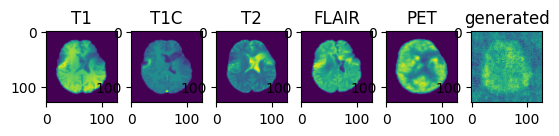

validation avg MS-SSIM: 0.2863 , train avg MS-SSIM: 0.2946
----------
epoch 191/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:16, 83.32s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

----------
epoch 192/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:23, 78.53s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:40, 34.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:58, 19.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.13s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:06,  9.44s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.85s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.32s/it]

----------
epoch 193/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:01, 82.00s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.60s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 194/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:44, 80.42s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.81s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.48s/it]

----------
epoch 195/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.86s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 35.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 196/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:24, 78.55s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:40, 34.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:58, 19.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:45, 13.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.36s/it]

----------
epoch 197/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:06, 82.42s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.78s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

----------
epoch 198/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.89s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.34s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:43,  7.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.50s/it]

----------
epoch 199/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:19, 83.60s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.93s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.18s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 200/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.05s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

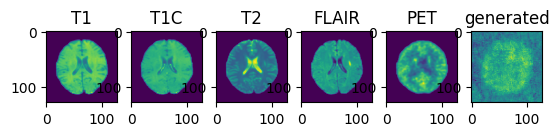

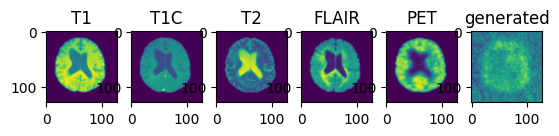

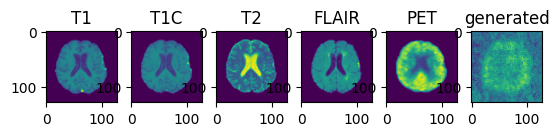

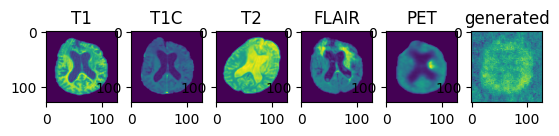

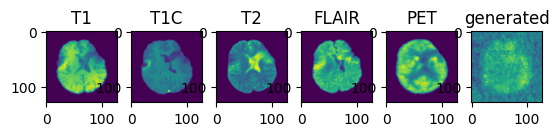

validation avg MS-SSIM: 0.3000 , train avg MS-SSIM: 0.3100
----------
epoch 201/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:19, 78.13s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:39, 33.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:43,  7.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.31s/it]

----------
epoch 202/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:18, 83.52s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.94s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

----------
epoch 203/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:56, 81.52s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 204/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:10, 82.78s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 205/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.84s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.98s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 206/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:54, 81.33s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.48s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:07,  9.71s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.56s/it]

----------
epoch 207/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:10, 82.75s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 208/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:35, 79.55s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 209/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.63s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.76s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 210/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:46, 80.61s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:51, 35.10s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.68s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

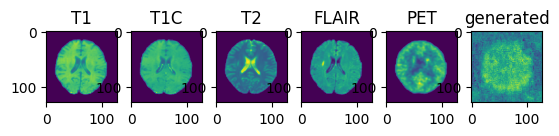

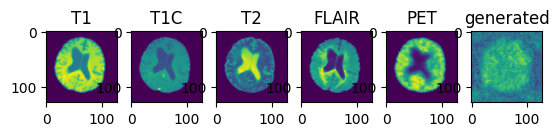

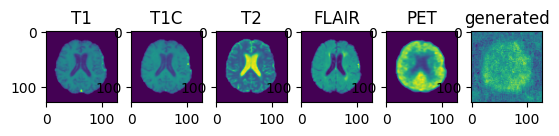

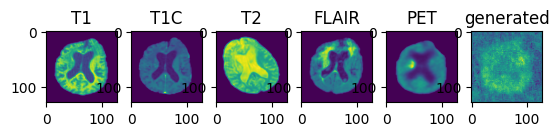

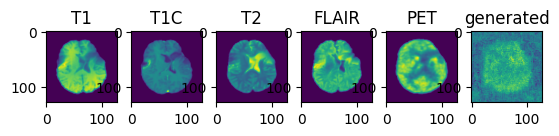

validation avg MS-SSIM: 0.2939 , train avg MS-SSIM: 0.3014
----------
epoch 211/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:00, 87.33s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:19, 37.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:17, 21.94s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:55, 14.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:11, 10.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:46,  7.76s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:51<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:08,  4.08s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.09s/it]

----------
epoch 212/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.08s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 213/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:59, 81.75s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 214/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:14, 83.09s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:59, 35.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 215/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:23, 83.97s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:02, 36.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 216/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:24, 84.04s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:02, 36.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 217/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:46, 80.59s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.89s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.51s/it]

----------
epoch 218/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:10, 82.76s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 219/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:55, 81.42s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 220/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:40, 80.03s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.17s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.45s/it]

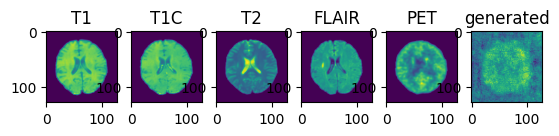

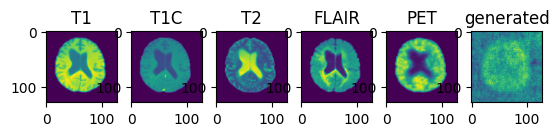

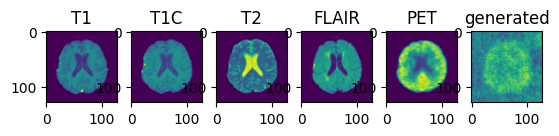

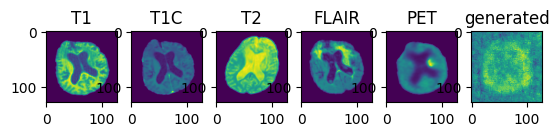

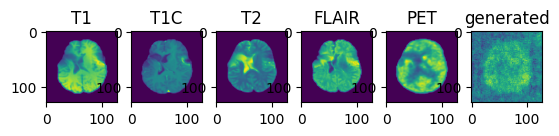

validation avg MS-SSIM: 0.2892 , train avg MS-SSIM: 0.2983
----------
epoch 221/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:38, 79.85s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.12s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.31s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:06,  9.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 222/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:44, 80.37s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.81s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 223/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.07s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.60s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 224/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:07, 82.54s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 225/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:22, 83.88s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:02, 36.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 226/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:38, 79.83s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.11s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.65s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.45s/it]

----------
epoch 227/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:12, 82.98s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 228/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.16s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.55s/it]

----------
epoch 229/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:59, 81.73s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.37s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.62s/it]

----------
epoch 230/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:14, 83.16s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.95s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.96s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

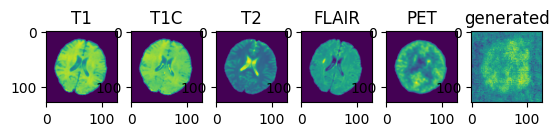

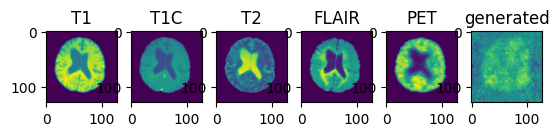

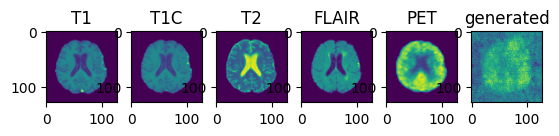

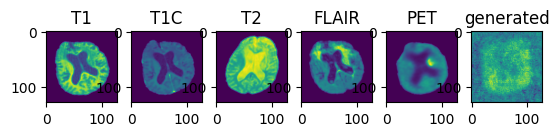

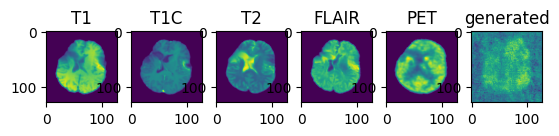

validation avg MS-SSIM: 0.2835 , train avg MS-SSIM: 0.2913
----------
epoch 231/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:04, 82.21s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:05, 20.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.63s/it]

----------
epoch 232/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:59, 81.76s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.58s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 233/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:25, 84.13s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:03, 36.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 234/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:39, 79.96s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.25s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.40s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:07,  9.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:43,  7.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.46s/it]

----------
epoch 235/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:04, 82.22s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.64s/it]

----------
epoch 236/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:14, 83.11s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.77s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 237/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:57, 81.60s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 238/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:50, 80.97s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.71s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 239/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:22, 83.84s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:02, 36.22s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.99s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.85s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.65s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

----------
epoch 240/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:50, 80.95s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

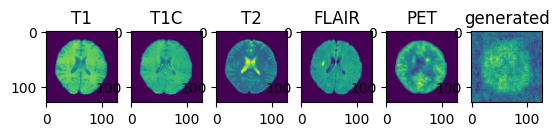

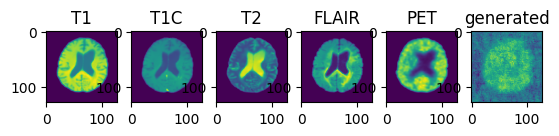

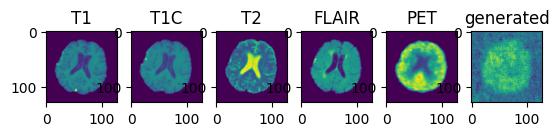

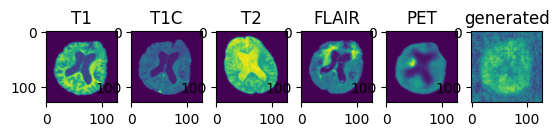

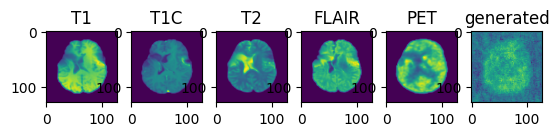

validation avg MS-SSIM: 0.3047 , train avg MS-SSIM: 0.3122
----------
epoch 241/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:06, 82.38s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.64s/it]

----------
epoch 242/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.09s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:05, 20.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 243/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:46, 80.62s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.89s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.49s/it]

----------
epoch 244/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:55, 81.41s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.24s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:07,  9.70s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 245/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:34, 84.95s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:52, 14.04s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:11, 10.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:46,  7.73s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 246/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:06, 87.82s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:18, 37.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:17, 21.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:55, 14.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:11, 10.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:46,  7.73s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:30,  6.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 247/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.10s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:55, 35.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

----------
epoch 248/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:30, 84.60s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:05, 36.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:09,  9.98s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:45,  7.57s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 249/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:35, 85.07s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:52, 14.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:46,  7.71s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.13s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 250/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:30, 84.56s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:52, 14.01s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

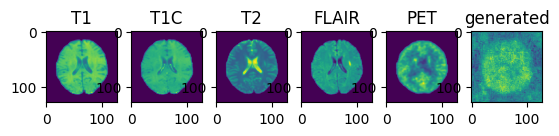

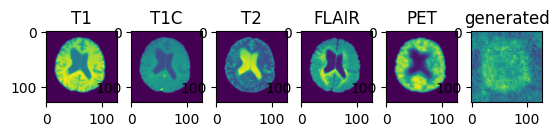

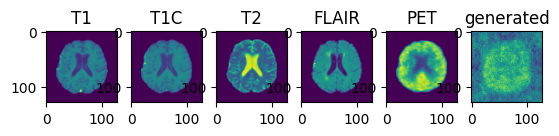

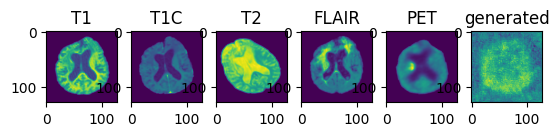

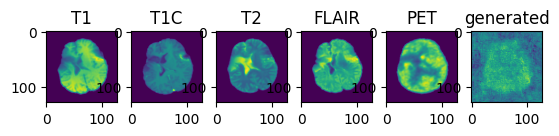

validation avg MS-SSIM: 0.2944 , train avg MS-SSIM: 0.3040
----------
epoch 251/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:29, 84.47s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:04, 36.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:51, 13.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.94s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 252/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:17, 83.43s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:07, 20.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.77s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09, 10.00s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

----------
epoch 253/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:04, 82.27s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

----------
epoch 254/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:55, 81.42s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.49s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 255/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:05, 82.35s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

----------
epoch 256/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:15, 83.18s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.77s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 257/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.90s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 258/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:07, 82.50s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 259/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:12, 82.91s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.10s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.93s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 260/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:16, 83.29s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.98s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:07, 20.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

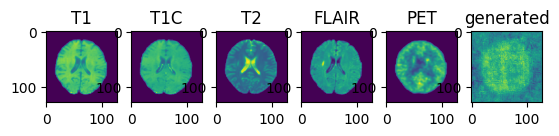

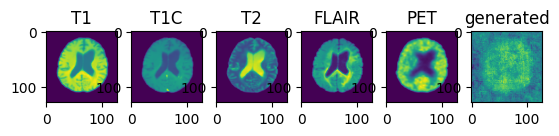

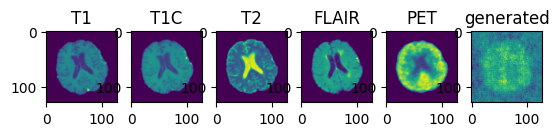

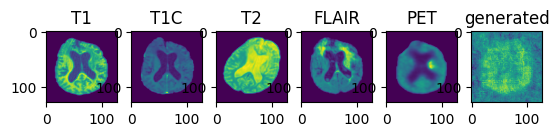

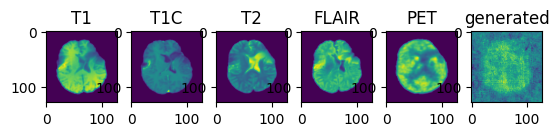

validation avg MS-SSIM: 0.2707 , train avg MS-SSIM: 0.2780
----------
epoch 261/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:06, 82.42s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 262/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:59, 81.79s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.37s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:06, 20.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 263/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.17s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:03, 20.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 264/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.09s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:55, 35.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 265/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:13, 83.04s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

----------
epoch 266/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.05s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 267/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.10s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 268/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:02, 82.03s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.77s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.67s/it]

----------
epoch 269/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:26, 84.20s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:03, 36.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.11s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:09, 10.00s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 270/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:03, 93.01s/it]

Epoch :  17%|██████                              | 2/12 [01:35<06:40, 40.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:38<03:27, 23.08s/it]

Epoch :  33%|████████████                        | 4/12 [01:42<02:02, 15.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:45<01:15, 10.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:48<00:48,  8.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:50<00:32,  6.43s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:53<00:21,  5.31s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:56<00:13,  4.55s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:59<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:02<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00, 10.61s/it]

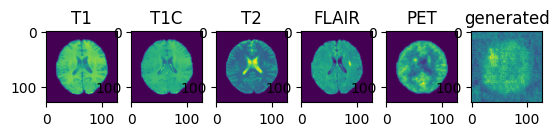

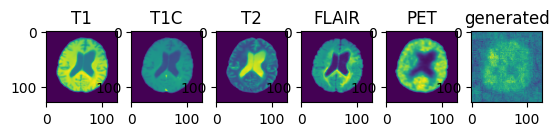

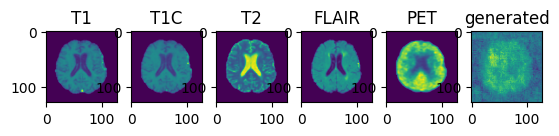

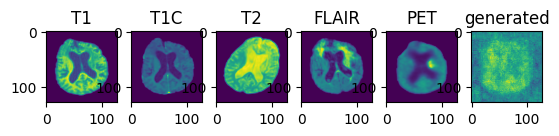

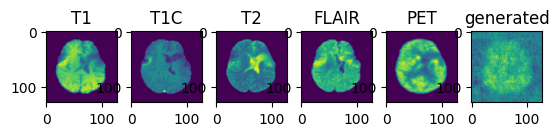

validation avg MS-SSIM: 0.2999 , train avg MS-SSIM: 0.3083
----------
epoch 271/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:23, 83.99s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:03, 36.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 272/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:07, 82.52s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.70s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 273/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:29, 84.52s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:05, 36.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.19s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:51, 13.99s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:46,  7.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 274/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:17, 83.39s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:03, 36.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 275/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.84s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

----------
epoch 276/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:06, 82.37s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

----------
epoch 277/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:17, 83.37s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 278/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:13, 83.03s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 279/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:35, 85.06s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:52, 14.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 280/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.90s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 21.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.86s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

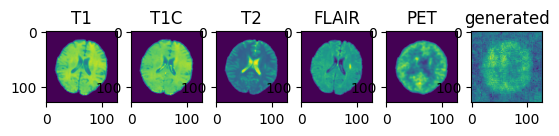

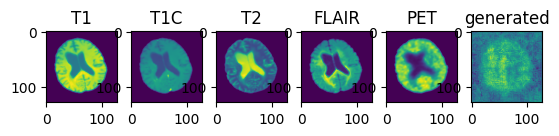

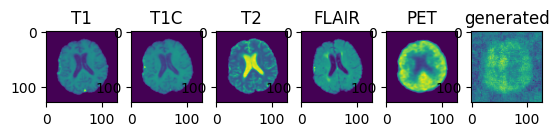

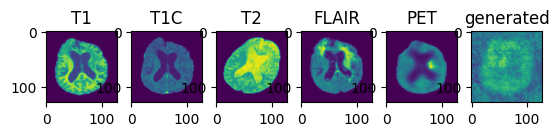

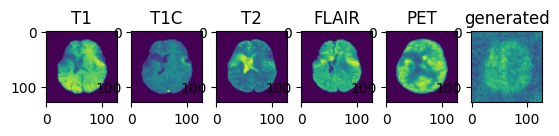

validation avg MS-SSIM: 0.2872 , train avg MS-SSIM: 0.2989
----------
epoch 281/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:15, 83.18s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 35.98s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:10, 10.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 282/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<15:59, 87.21s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:18, 37.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:16, 21.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:55, 14.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:11, 10.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:46,  7.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:08,  4.09s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.11s/it]

----------
epoch 283/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:01, 81.98s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:54, 35.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 284/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:21, 83.76s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:04, 36.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.17s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:51, 13.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.57s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 285/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:16, 83.30s/it]

Epoch :  17%|██████                              | 2/12 [01:26<05:59, 36.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:48,  8.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:32,  6.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:21,  5.30s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.57s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 286/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.86s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:50, 13.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 287/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:30<16:30, 90.05s/it]

Epoch :  17%|██████                              | 2/12 [01:32<06:27, 38.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:35<03:21, 22.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:38<01:57, 14.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:41<01:13, 10.44s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:44<00:47,  7.87s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:31,  6.37s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:21,  5.26s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:13,  4.52s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00, 10.31s/it]

----------
epoch 288/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:21, 83.74s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:10, 21.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.92s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 289/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:12, 82.98s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.69s/it]

----------
epoch 290/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.87s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.90s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.69s/it]

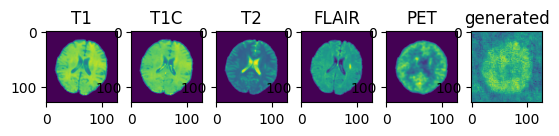

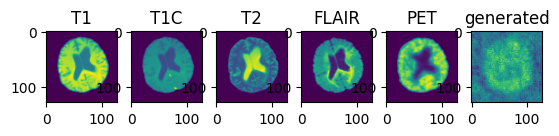

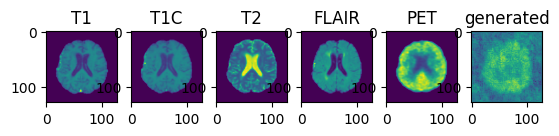

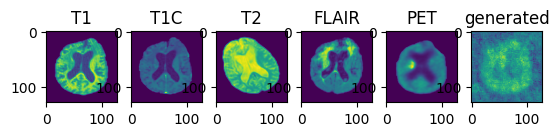

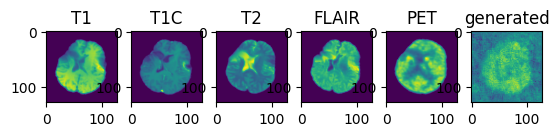

validation avg MS-SSIM: 0.3012 , train avg MS-SSIM: 0.3072
----------
epoch 291/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:22, 83.91s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:02, 36.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.68s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 292/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:23, 83.95s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:12, 37.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:14, 21.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:53, 14.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:10, 10.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:55<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 293/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:09, 82.71s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:30,  6.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 294/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:17, 83.39s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:10, 21.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 295/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:31, 84.68s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:05, 36.58s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:10, 21.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:09,  9.98s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:45,  7.57s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 296/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:33, 84.86s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:06, 36.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:53, 14.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:10, 10.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:45,  7.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:30,  6.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 297/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.16s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:51, 35.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:47, 13.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:07,  9.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:44,  7.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 298/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:57, 81.56s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.52s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:48, 13.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 299/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:20, 83.66s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:08, 20.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:50, 13.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:45,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

----------
epoch 300/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:05, 82.35s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:49, 13.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

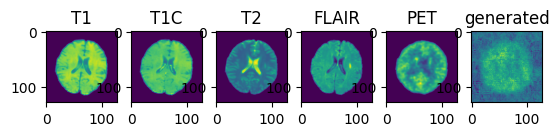

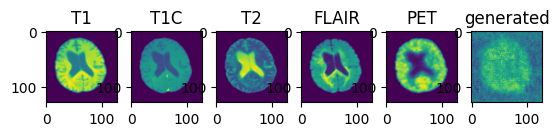

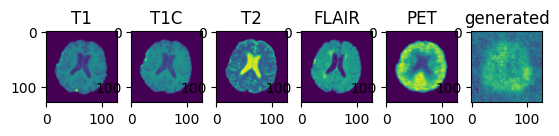

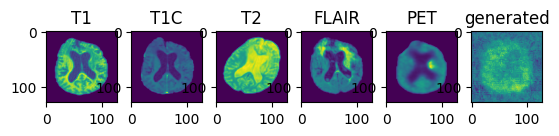

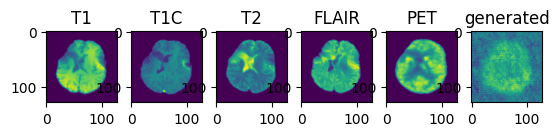

validation avg MS-SSIM: 0.3068 , train avg MS-SSIM: 0.3096


In [12]:
epoch_loss_values = [(0, 0)]
gen_step_loss = []
disc_step_loss = []
step = 0
max_epochs = 300
disc_train_interval = 1
disc_train_steps = 1
validation_interval = 10
best_ssim = 0
torch.cuda.empty_cache()

for epoch in range(max_epochs):
    
    gen_net.train()
    disc_net.train()
    epoch_loss = 0

    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    for batch_data in tqdm(train_loader, desc=("Epoch ")):
        input_images = torch.cat((batch_data["t1"].to(device, dtype=torch.float), 
                                 batch_data["t1c"].to(device, dtype=torch.float), 
                                 batch_data["t2"].to(device, dtype=torch.float), 
                                 batch_data["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        real_pet = batch_data["pet"].to(device, dtype=torch.float)
        
        gen_opt.zero_grad()
        gen_images = gen_net(input_images)
        loss = generator_loss(gen_images, real_pet)
        loss.backward()
        gen_opt.step()
        epoch_loss += loss.item()
        
        real_pet = real_pet[:,0,:,:,:]
        gen_images = gen_images[:,0,:,:,:]

        gen_step_loss.append((step, loss.item()))

        if step % disc_train_interval == 0:
            disc_total_loss = 0

            for _ in range(disc_train_steps):
                disc_opt.zero_grad()
                dloss = discriminator_loss(gen_images, real_pet)
                dloss.backward()
                disc_opt.step()
                disc_total_loss += dloss.item()

            disc_step_loss.append((step, disc_total_loss / disc_train_steps))
        step += 1
    
    epoch_loss /= step
    epoch_loss_values.append((step, epoch_loss))

    if (epoch+1) % validation_interval == 0:
        gen_net.eval()
        slice_index = 32
        ms_ssim = []
        ms_ssim_train = []
        ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)
        
        with torch.no_grad():

            for item in train_metric_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)
                
                generated = gen_net(input_images)
                ms_ssim_train.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))

            curr_ssim_train = torch.mean(torch.FloatTensor(ms_ssim_train))
            
            for item in valid_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

                generated = gen_net(input_images)
        
                image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
                f, axarr = plt.subplots(1, 6)

                ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
                axarr[0].imshow(image_datas[0])
                axarr[0].set_title("T1")
                axarr[1].imshow(image_datas[1])
                axarr[1].set_title("T1C")
                axarr[2].imshow(image_datas[2])
                axarr[2].set_title("T2")
                axarr[3].imshow(image_datas[3])
                axarr[3].set_title("FLAIR")
                axarr[4].imshow(image_datas[4])
                axarr[4].set_title("PET")
                axarr[5].imshow(image_datas[5].cpu())
                axarr[5].set_title("generated")
                plt.show()
                
            curr_ssim = torch.mean(torch.FloatTensor(ms_ssim))

            if curr_ssim > best_ssim:
                best_ssim = curr_ssim
                torch.save({
                        'epoch': epoch,
                        'model_state_dict': gen_net.state_dict(),
                        'optimizer_state_dict': gen_opt.state_dict(),
                        }, "best_metric_glagan.pth")
                
        print("validation avg MS-SSIM: {:.4f} , train avg MS-SSIM: {:.4f}".format(curr_ssim, curr_ssim_train))
            

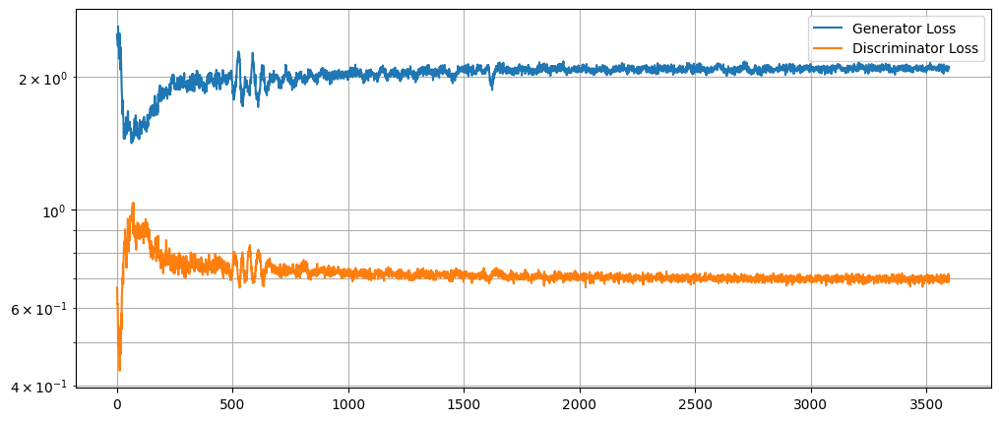

In [13]:
plt.figure(figsize=(12, 5))
plt.semilogy(*zip(*gen_step_loss), label="Generator Loss")
plt.semilogy(*zip(*disc_step_loss), label="Discriminator Loss")
plt.grid(True, "both", "both")
plt.legend()

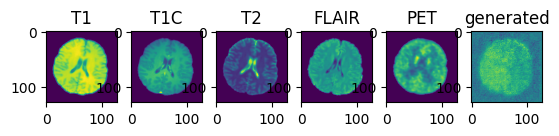

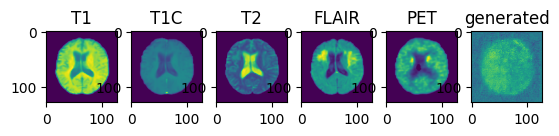

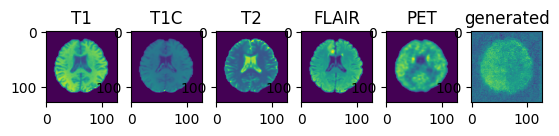

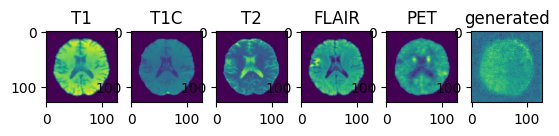

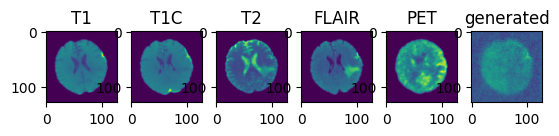

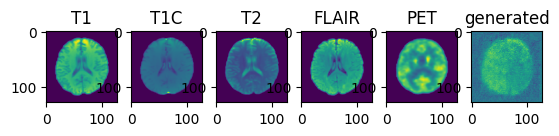

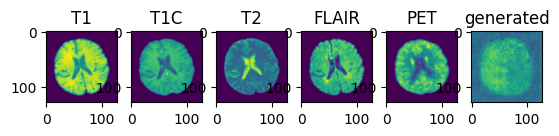

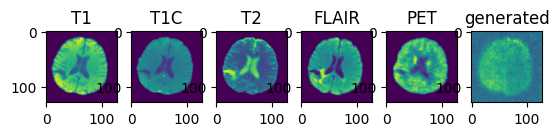

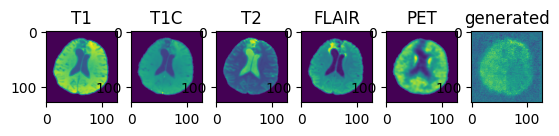

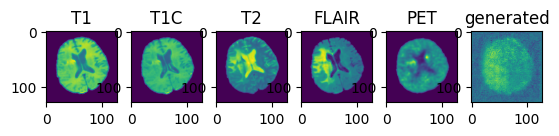

It has been 40254.988246679306 seconds since the loop started
validation avg MS-SSIM: 0.3644 validation avg MSE 0.0000


In [14]:

slice_index = 32

torch.cuda.empty_cache()

saved_dict = torch.load("best_metric_glagan.pth")
gen_net.load_state_dict(saved_dict['model_state_dict'])
gen_net.eval()

ms_ssim = []
ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)

for item in check_DataLoader:

    with torch.no_grad():
        
        input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        generated = gen_net(input_images)
        
        image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
        f, axarr = plt.subplots(1, 6)

        ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
        axarr[0].imshow(image_datas[0])
        axarr[0].set_title("T1")
        axarr[1].imshow(image_datas[1])
        axarr[1].set_title("T1C")
        axarr[2].imshow(image_datas[2])
        axarr[2].set_title("T2")
        axarr[3].imshow(image_datas[3])
        axarr[3].set_title("FLAIR")
        axarr[4].imshow(image_datas[4])
        axarr[4].set_title("PET")
        axarr[5].imshow(image_datas[5].cpu())
        axarr[5].set_title("generated")
        plt.show()


now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

print("validation avg MS-SSIM: {:.4f} validation avg MSE {:.4f}".format(torch.mean(torch.FloatTensor(ms_ssim)), 0))